In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from matplotlib import animation, rc
from IPython.display import HTML, Image

rc('animation', html='jshtml')

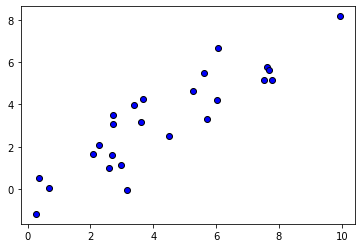

In [2]:
nsamp = 25
x_data = np.random.uniform(0,10,nsamp)
y_data = .8*x_data + np.random.normal(0, 1, size=x_data.shape)

plt.plot(x_data, y_data, 'ob', markeredgecolor='black');

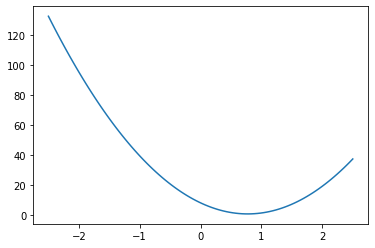

In [3]:
def Model(x,w):
    return w*x

def LossFunc(x_batch,y_batch, w):
    N = w.shape[0]
    J = np.empty((N,1))
    for i in range(N):
        J[i] = np.mean((y_batch-Model(x_batch,w[i]))**2)/2
    return J

wspace = np.linspace(-2.5,2.5,100)
J = LossFunc(x_data, y_data, wspace)

plt.plot(wspace, J);

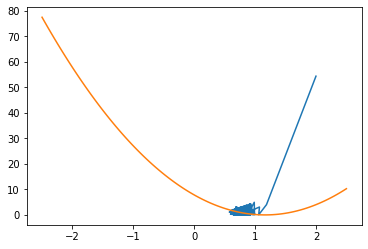

In [19]:
# mini-batch gradient descent
EPOCHS = 25
BATCH_SIZE = 1
ALPHA = .01

niter = int(np.floor(nsamp/BATCH_SIZE))
nstep = niter*EPOCHS

w = np.empty((nstep+1,1))
w[0] = 2

J_batchspace = []
Jw_batch = []

def GradJ(x,y,w):
    mx  = np.mean(x)
    mxx = np.mean(x**2)
    mxy = np.mean(x*y)
    return w*mxx - mxy

n = 1
for e in range(1,EPOCHS+1):
    for i in range(1,niter+1):
        choices = np.random.choice(nsamp, size=BATCH_SIZE)
        xb = x_data[choices]; yb = y_data[choices]
        J_batchspace.append(LossFunc(xb,yb,wspace))
        Jw_batch.append(LossFunc(xb,yb,w[n-1]))
        w[n] = w[n-1] - ALPHA*GradJ(xb,yb,w[n-1])
        n+=1

w = w[:-1]
        
Jw = LossFunc(x_data, y_data, w)
Jw_batch = np.array(Jw_batch).reshape(-1,1)

plt.plot(w, Jw_batch, wspace, J_batchspace[2])

In [20]:
fig, ax = plt.subplots()

ax.set_xlim((-.5,2.5))
ax.set_ylim((-.5,np.max(Jw)))
#ax.set_aspect('equal')
ax.grid()

X = np.hstack([w,Jw])
X_batch = np.hstack([w,Jw_batch])


color = np.exp(-np.arange(0-1,-1,-1))

lines = [ax.scatter([],[], c='blue', marker='o'), # weights vector points
         ax.plot([],[], '-r', lw=2)[0], # global cost function
         ax.plot([],[], '--b', lw=2)[0], # batch cost function
        ]
lines.append(ax.legend((lines[1],lines[0],lines[2]), 
                       ('Global Loss',r'$J(w_n)$','Mini-Batch Loss'), loc='lower right'))
lines.append(ax.text(0.05, 0.9, '', transform=ax.transAxes)) # time-step 

plt.close()

In [21]:
def init():
    lines[0].set_offsets([])
    lines[1].set_data(wspace,J)
    lines[1].set_color((1,0,0,1))
    lines[2].set_data([],[])
    lines[2].set_color((0,0,1,.8))
    lines[-1].set_text('')
    return lines

In [22]:
def animate(i):
    lines[0].set_offsets(X_batch[:i+1,:]) # set data for scatter plot
    color = np.exp(-10*np.arange(i,-1,-1))
    z = np.zeros_like(color)
    C = [(0,0,1,a) for a in color]
    lines[0].set_color(C)
    lines[2].set_data(wspace,J_batchspace[i])
    lines[-1].set_text('n = %d' % (i+1))
    return lines

In [23]:
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=nstep, interval=100, blit=True)

In [24]:
anim

In [25]:
anim.save('../sgd_1D_lr0_01_bs1.gif', writer='imagemagick')

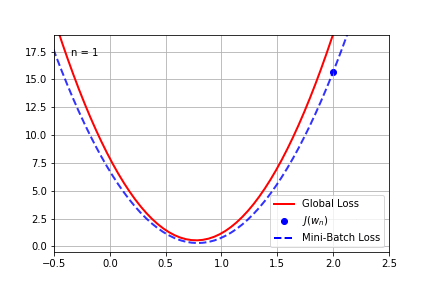

In [18]:
Image(filename='../sgd_1D_lr0_01_bs1.gif')